# <font color=#214B99>Projet 6 - Améliorez le produit IA de votre start-up</font>

# <font color=#009BFA>Partie A : Analyse des commentaires pour détecter les sujets d'insatisfaction</font>

## Objectif du projet : 
- **Détecter les sujets d’insatisfaction présents dans les commentaires postés sur la plateforme**
- **Labelliser automatiquement les photos postées sur la plateforme**
- **Collecter de nouvelles données via l’API Yelp**

## Trois parties :
- **Partie A : analyser les commentaires pour détecter les différents sujets d’insatisfaction**
- **Partie B : analyser les photos pour déterminer les catégories des photos**
- **Partie C : collecter un échantillon de données via l’API Yelp**

## <font color="#009BFA">Sommaire</font>
1. [Récupération des données textuelles](#section_1)<br>
    1.1. [Chargement du fichier des établissement](#section_1_1)<br>
    1.2. [Sélection des établissements de catégorie "Restaurants"](#section_1_2)<br>
    1.3. [Chargement du fichier des commentaires](#section_1_3)<br>
    1.4. [Regroupement des 2 jeux de données ](#section_1_4)<br>
    1.5. [Sélection des commentaires ayant `1 star` & Création d'un nouveau dataset](#section_1_5)<br>
    
2. [Preprocessing des données textuelles](#section_2)<br>
    2.1. [Chargement des données](#section_2_1)<br>
    2.2. [Suppression des colonnes inutiles](#section_2_2)<br>
    2.3. [Pré-traitement des données textuelles](#section_2_3)<br>

3. [Techniques de réduction de dimension : Feature Engineering, Topic Modeling & Dimension Reduction](#section_3)<br>
    3.1. [Utilisation de Gensim pour le Topic Modeling](#section_3_1)<br>
    3.2. [Représentation Bag-Of-Words](#section_3_2)<br>
    3.3. [Modélisation LDA : Latent Dirichlet Allocation](#section_3_3)<br>
    .... 3.3.1. [Modèle LDA avec Bag-Of-Words](#section_3_3_1)<br>
    .... 3.3.2. [Visualisation des données de grandes dimensions](#section_3_3_2)<br>
    .... 3.3.3. [Représentation TF-IDF](#section_3_3_3)<br>
    .... 3.3.4. [Représentation TF-IDF](#section_3_3_4)<br>
    3.4. [Modélisation NMF : Non-Negative Matrix Factorization](#section_3_4)<br>
    .... 3.4.1. [Modèle NMF avec Bag-Of-Words](#section_3_4_1)<br>
    .... 3.4.1. [Modèle NMF avec TF-IDF](#section_3_4_1)<br>

4. [Conclusion](#section_4)<br>
  

**Pour que le travail réalisé soit compréhensible et visualisable, nous avons :<br>
     - décrit de façon simple les différentes étapes et les algorithmes utilisés.<br>
     - ajouté de nombreux graphiques et utilisé des algorithmes et bibliothèques dédiés à la visualisation.**

***
## <font color=#B72000>Nota Bene</font>

- Des warnings apparaissent dans le Notebook, ces warnings sont causés par la librairie PyLDAvis
- Ils apparaissent malgré le filtrage des warnings !
- Afin de les cacher merci de cliquer sur le bouton ci-dessous :

In [85]:
from IPython.display import HTML

HTML(
    """<script>
code_show_err=false; 
function code_toggle_err() {
 if (code_show_err){
 $('div.output_stderr').hide();
 } else {
 $('div.output_stderr').show();
 }
 code_show_err = !code_show_err
} 
$( document ).ready(code_toggle_err);
</script>
POUR CACHER LES WARNINGS, CLIQUER <a href="javascript:code_toggle_err()">ICI</a>."""
)

<IPython.core.display.Javascript object>

***

In [86]:
# Chargement des librairies
from datetime import datetime
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

import spacy
import pyLDAvis
import pyLDAvis.gensim_models  # as gensimvis

from gensim import corpora
from gensim.models.ldamodel import LdaModel
from gensim.parsing.preprocessing import preprocess_string
from gensim.models.coherencemodel import CoherenceModel
from gensim.models import TfidfModel
from gensim.models.nmf import Nmf

import json
import re


nlp = spacy.load("en_core_web_sm")
pyLDAvis.enable_notebook()


# Valide code pep8
%load_ext nb_black

now = datetime.now().isoformat()
print("Lancé le           : " + now)

The nb_black extension is already loaded. To reload it, use:
  %reload_ext nb_black
Lancé le           : 2022-04-28T16:49:05.845046


<IPython.core.display.Javascript object>

In [87]:
if not sys.warnoptions:
    import warnings

    warnings.simplefilter("ignore")

<IPython.core.display.Javascript object>

In [88]:
#pd.set_option("display.max_column", 100)
#pd.set_option("display.max_row", 100)

<IPython.core.display.Javascript object>

## Structuration du projet sous forme de fonctions :
- Les différentes étapes du projet sont écrites sous forme de fonction
- Ces fonctions permettent d'automatiser l'analyse
- Une fonction 'pipeline' regroupant ces fonctions est utilisée pour la modélisation `LDA` avec une représetation `TF-IDF` et recheche les sujets d'insatisfaction client

 # <span style='color:blue' id="section_1" >1. Récupération des données textuelles</span>

Les données de Yelp sont ditributées dans différents fichiers, nous utiliserons les fichiers **yelp_academic_dataset_business.json** et **yelp_academic_dataset_review.json**.

Parmi les différents établissements du fichier **yelp_academic_dataset_business.json** nous allons sélectionner la catégorie `Restaurants`.<br>
Le "text" correspond au texte du commentaire et "stars" correspond à la note attribuée par le client.

## <span style='color:green' id="section_1_1" >1.1. Chargement du fichier des établissements </span>

In [167]:
# Extrait les données json dans un DataFrame
def extract_data(path: str):
    data_file = open(path)
    name_file = path.split("/")[-1]

    print(f"Extraction du fichier : {name_file}")

    data = [json.loads(line) for line in data_file]
    df = pd.DataFrame(data)

    return df

<IPython.core.display.Javascript object>

In [168]:
# Affiche la taille du jeu de données
def displayDataShape(message, data):
    shape = data.shape
    print(f"{message} : {shape[0]} lignes et {shape[1]} colonnes\n")

<IPython.core.display.Javascript object>

In [170]:
path_dataset = "./yelp_dataset/"

<IPython.core.display.Javascript object>

In [188]:
data_business = extract_data(path_dataset + "yelp_academic_dataset_business.json")

Extraction du fichier : yelp_academic_dataset_business.json


<IPython.core.display.Javascript object>

In [189]:
displayDataShape("Le fichier data_business contient", data_business)

Le fichier data_business contient : 150346 lignes et 14 colonnes



<IPython.core.display.Javascript object>

In [190]:
data_business.head(3)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."


<IPython.core.display.Javascript object>

In [174]:
data_business = data_business[["business_id", "categories"]].dropna(
    subset=["categories"]
)

<IPython.core.display.Javascript object>

## <span style='color:green' id="section_1_2" >1.2. Sélection des établissements de catégorie "Restaurants" </span>

In [175]:
selected_categories = ["Restaurants"]

<IPython.core.display.Javascript object>

In [176]:
def check_categorie(cat):
    values = [x.strip() for x in cat.split(",")]

    for value in values:
        if value in selected_categories:
            return True

    return False

<IPython.core.display.Javascript object>

In [177]:
data_business = data_business[
    data_business["categories"].apply(lambda x: check_categorie(x))
]
data_business

,business_id,categories
3,MTSW4McQd7CbVtyjqoe9mw,"Restaurants, Food, Bubble Tea, Coffee & Tea, B..."
5,CF33F8-E6oudUQ46HnavjQ,"Burgers, Fast Food, Sandwiches, Food, Ice Crea..."
8,k0hlBqXX-Bt0vf1op7Jr1w,"Pubs, Restaurants, Italian, Bars, American (Tr..."
9,bBDDEgkFA1Otx9Lfe7BZUQ,"Ice Cream & Frozen Yogurt, Fast Food, Burgers,..."
11,eEOYSgkmpB90uNA7lDOMRA,"Vietnamese, Food, Restaurants, Food Trucks"
...,...,...
150325,l9eLGG9ZKpLJzboZq-9LRQ,"Restaurants, Sandwiches, Convenience Stores, C..."
150327,cM6V90ExQD6KMSU3rRB5ZA,"Cafes, Juice Bars & Smoothies, Coffee & Tea, R..."
150336,WnT9NIzQgLlILjPT0kEcsQ,"Restaurants, Mexican"
150339,2O2K6SXPWv56amqxCECd4w,"Restaurants, Comfort Food, Food, Food Trucks, ..."


<IPython.core.display.Javascript object>

In [178]:
displayDataShape("Le fichier data_business contient maintenant", data_business)

Le fichier data_business contient maintenant : 52268 lignes et 2 colonnes



<IPython.core.display.Javascript object>

## <span style='color:green' id="section_1_3" >1.3. Chargement du fichier des commentaires </span>

In [179]:
data_review = extract_data(path_dataset + "yelp_academic_dataset_review.json")

Extraction du fichier : yelp_academic_dataset_review.json


<IPython.core.display.Javascript object>

In [180]:
displayDataShape("Le fichier data_review contient", data_review)

Le fichier data_review contient : 6990280 lignes et 9 colonnes



<IPython.core.display.Javascript object>

In [181]:
data_review.head(3)

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3.0,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11
1,BiTunyQ73aT9WBnpR9DZGw,OyoGAe7OKpv6SyGZT5g77Q,7ATYjTIgM3jUlt4UM3IypQ,5.0,1,0,1,I've taken a lot of spin classes over the year...,2012-01-03 15:28:18
2,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3.0,0,0,0,Family diner. Had the buffet. Eclectic assortm...,2014-02-05 20:30:30


<IPython.core.display.Javascript object>

In [182]:
data_review = data_review[["business_id", "stars", "text"]]

<IPython.core.display.Javascript object>

## <span style='color:green' id="section_1_4" >1.4. Regroupement des 2 jeux de données </span>

In [183]:
data_final = data_business.merge(
    data_review, how="left", on="business_id", validate="1:m"
)
data_final

,business_id,categories,stars,text
0,MTSW4McQd7CbVtyjqoe9mw,"Restaurants, Food, Bubble Tea, Coffee & Tea, B...",4.0,This is nice little Chinese bakery in the hear...
1,MTSW4McQd7CbVtyjqoe9mw,"Restaurants, Food, Bubble Tea, Coffee & Tea, B...",4.0,This is the bakery I usually go to in Chinatow...
2,MTSW4McQd7CbVtyjqoe9mw,"Restaurants, Food, Bubble Tea, Coffee & Tea, B...",5.0,"A delightful find in Chinatown! Very clean, an..."
3,MTSW4McQd7CbVtyjqoe9mw,"Restaurants, Food, Bubble Tea, Coffee & Tea, B...",5.0,I ordered a graduation cake for my niece and i...
4,MTSW4McQd7CbVtyjqoe9mw,"Restaurants, Food, Bubble Tea, Coffee & Tea, B...",4.0,HK-STYLE MILK TEA: FOUR STARS\n\nNot quite su...
...,...,...,...,...
4724466,hn9Toz3s-Ei3uZPt7esExA,"Middle Eastern, Restaurants",5.0,YES.\n\nI have been to 2 other comparable Midd...
4724467,hn9Toz3s-Ei3uZPt7esExA,"Middle Eastern, Restaurants",5.0,We had the beef plate medium rare that was mou...
4724468,hn9Toz3s-Ei3uZPt7esExA,"Middle Eastern, Restaurants",5.0,Excellent Mediterranean food! Always cooked to...
4724469,hn9Toz3s-Ei3uZPt7esExA,"Middle Eastern, Restaurants",4.0,This was my first visit to West Side Kebab Hou...


<IPython.core.display.Javascript object>

## <span style='color:green' id="section_1_5" >1.5. Sélection des commentaires ayant `1 star` & Création d'un nouveau dataset </span>

In [185]:
poor_reviews = data_final[data_final["stars"] == 1]
poor_reviews

,business_id,categories,stars,text
36,MTSW4McQd7CbVtyjqoe9mw,"Restaurants, Food, Bubble Tea, Coffee & Tea, B...",1.0,Horrible 3rd world service. After I picked out...
37,MTSW4McQd7CbVtyjqoe9mw,"Restaurants, Food, Bubble Tea, Coffee & Tea, B...",1.0,"Looks like a nice place from the outside, but ..."
42,MTSW4McQd7CbVtyjqoe9mw,"Restaurants, Food, Bubble Tea, Coffee & Tea, B...",1.0,bun is sucked here and the waitress was really...
54,MTSW4McQd7CbVtyjqoe9mw,"Restaurants, Food, Bubble Tea, Coffee & Tea, B...",1.0,TERRIBLE TERRIBLE service. I have never felt s...
72,MTSW4McQd7CbVtyjqoe9mw,"Restaurants, Food, Bubble Tea, Coffee & Tea, B...",1.0,Not sure what happen. I have order a taro cake...
...,...,...,...,...
4724396,cM6V90ExQD6KMSU3rRB5ZA,"Cafes, Juice Bars & Smoothies, Coffee & Tea, R...",1.0,These people don't know how to make a plain la...
4724399,cM6V90ExQD6KMSU3rRB5ZA,"Cafes, Juice Bars & Smoothies, Coffee & Tea, R...",1.0,They turned off the heaters while we were wait...
4724422,WnT9NIzQgLlILjPT0kEcsQ,"Restaurants, Mexican",1.0,"Today I order from Uber eats, I order cheese e..."
4724451,2O2K6SXPWv56amqxCECd4w,"Restaurants, Comfort Food, Food, Food Trucks, ...",1.0,The truck was invited to our office for a part...


<IPython.core.display.Javascript object>

In [186]:
poor_reviews.to_csv("negative_reviews.csv", index=False)

<IPython.core.display.Javascript object>

 # <span style='color:blue' id="section_2" >2. Preprocessing des données textuelles</span>

 ## <span style='color:green' id="section_2_1" >2.1 Chargement des données</span>

#### Nous n'avons gardé que les commentaires négatifs dont la note est égale à 1.

In [89]:
filename = "negative_reviews.csv"

<IPython.core.display.Javascript object>

In [90]:
missing_values = ["na", "n/a", "--", " "]

raw_data_neg_reviews = pd.read_csv(
    filename,
    nrows=100000,
    sep=",",
    na_values=missing_values,
    low_memory=False,
    encoding="utf8",
)

<IPython.core.display.Javascript object>

In [91]:
# raw_data_neg_reviews = pd.read_csv(filename, nrows=100000)
raw_df_neg_reviews = raw_data_neg_reviews.copy()

<IPython.core.display.Javascript object>

In [92]:
SEED = 0
frac = 0.8
raw_df_neg_reviews_sample = raw_df_neg_reviews.sample(frac=frac, random_state=42)

<IPython.core.display.Javascript object>

In [93]:
print(
    f"Nombre de commentaires client négatifs de l'échantillon : {raw_df_neg_reviews_sample.shape[0]}"
)

Nombre de commentaires client négatifs de l'échantillon : 80000


<IPython.core.display.Javascript object>

In [94]:
raw_df_neg_reviews_sample.head()

,business_id,categories,stars,text
75721,0jpFptAehZhLl3nkhHDanA,"Restaurants, Event Planning & Services, Hotels...",1.0,Warning!!!!! Valet damaged my Rolls Royce!!! \...
80184,of-GVqY0G_UDHXT9Xg_ADQ,"Bars, Nightlife, Kosher, Burgers, Tapas/Small ...",1.0,Hostess was really rude and called me a dumbas...
19864,2PlhAoV-zXw2SUaWzkw-Ng,"Restaurants, Ice Cream & Frozen Yogurt, Burger...",1.0,Food is so so.What got me is how very UN-clean...
76699,z3TB52s5p5PcRsw2T3J6MQ,"Food Trucks, Food, Restaurants, Mexican",1.0,Use to live this place. Last 6 times the wait ...
92991,20-EyTyDc2-a30iDAQj64g,"American (Traditional), Local Flavor, Restaura...",1.0,"I normally don't post bad reviews, but I'm hop..."


<IPython.core.display.Javascript object>

 ## <span style='color:green' id="section_2_2" >2.2. Suppression des colonnes inutiles</span>

#### Les colonnes suivantes sont inutiles pour notre analyse, nous les supprimons :
- `business_id`,
- `categories`,

In [95]:
useless_columns = ["business_id", "categories"]

<IPython.core.display.Javascript object>

In [96]:
# drop of useless columns
def clean_data(
    df_neg_reviews,
    columns_to_drop=useless_columns,
):
    # columns_to_drop
    df_neg_reviews_clean = df_neg_reviews.drop(columns=columns_to_drop)
    print("Nettoyage des données : OK")
    return df_neg_reviews_clean

<IPython.core.display.Javascript object>

In [97]:
# drop of useless columns
df_neg_reviews_clean = clean_data(raw_df_neg_reviews_sample)

Nettoyage des données : OK


<IPython.core.display.Javascript object>

In [98]:
print("Dataset nettoyé : ")
df_neg_reviews_clean

Dataset nettoyé : 


,stars,text
75721,1.0,Warning!!!!! Valet damaged my Rolls Royce!!! \...
80184,1.0,Hostess was really rude and called me a dumbas...
19864,1.0,Food is so so.What got me is how very UN-clean...
76699,1.0,Use to live this place. Last 6 times the wait ...
92991,1.0,"I normally don't post bad reviews, but I'm hop..."
...,...,...
6306,1.0,"The fish tacos where awesome, the beans, the c..."
51901,1.0,Most dysfunctional McDonald's I've ever been t...
6028,1.0,"I ordered here for the first time today, and ..."
58507,1.0,"Wow, how things have changed. This use to be t..."


<IPython.core.display.Javascript object>

 ## <span style='color:green' id="section_2_3" >2.3. Pré-traitement des données textuelles</span>
- Tokenization
- Stop Words
- Lemmatization
- Part-Of-Speech Tagging

### Utilisation de SpaCY pour le Pre Processing

In [99]:
def preprocessing(text, allowed_postags=["NOUN"]):
    doc = nlp(text)
    tokens = [
        token.lemma_
        for token in doc
        if (not (token.is_stop or token.is_punct) and (token.pos_ in allowed_postags))
    ]
    return " ".join(tokens)

<IPython.core.display.Javascript object>

#### On ne garde que les tag Part-Of-Speech de type 'NOUN' (nom) qui nous seront utiles dans l'analyse

In [100]:
def preprocess_data(df_neg_reviews, preprocessing_fct):
    df_neg_reviews["neg_reviews_preprocessed"] = df_neg_reviews.text.apply(
        lambda text: preprocessing_fct(text)
    )
    print("PreProcessing des données : OK")
    return df_neg_reviews

<IPython.core.display.Javascript object>

In [101]:
df_neg_reviews_preprocessed = preprocess_data(df_neg_reviews_clean, preprocessing)

PreProcessing des données : OK


<IPython.core.display.Javascript object>

In [102]:
print("Dataset après PreProcessing : ")
df_neg_reviews_preprocessed

Dataset après PreProcessing : 


,stars,text,neg_reviews_preprocessed
75721,1.0,Warning!!!!! Valet damaged my Rolls Royce!!! \...,hotel lack action matter valet 22nd hotel hote...
80184,1.0,Hostess was really rude and called me a dumbas...,dumbass rope service
19864,1.0,Food is so so.What got me is how very UN-clean...,food place bathroom week table holder wood wor...
76699,1.0,Use to live this place. Last 6 times the wait ...,place time wait add people food way ton salsas...
92991,1.0,"I normally don't post bad reviews, but I'm hop...",review owner customer dissatisfaction breakfas...
...,...,...,...
6306,1.0,"The fish tacos where awesome, the beans, the c...",fish bean chip hair guacamole hair color way meal
51901,1.0,Most dysfunctional McDonald's I've ever been t...,dysfunctional review thing paper food greatnes...
6028,1.0,"I ordered here for the first time today, and ...",time today experience customer service order m...
58507,1.0,"Wow, how things have changed. This use to be t...",thing use place year mighty pace elevation bar...


<IPython.core.display.Javascript object>

In [103]:
df_neg_reviews_preprocessed.shape

(80000, 3)

<IPython.core.display.Javascript object>

# <span style='color:blue' id="section_3">3. Techniques de réduction de dimension :</span>
>>  ## <span style='color:blue' id="section_3"> Feature Engineering, Topic Modeling & Dimension Reduction</span>

## <span style='color:green' id="section_3_1">3.1. Utilisation de Gensim pour le Topic Modeling</span>

### Création du Dictionnaire de mots

##### Dictionary :
- list de mot unique
- indice de chaque mot

In [104]:
def create_dictionary(df_neg_reviews):
    # On met les critiques sous forme de listes de mots
    list_neg_reviews = [
        c.split() for c in df_neg_reviews["neg_reviews_preprocessed"].to_list()
    ]
    # Création du dictionnaire de mots
    dictionary = corpora.Dictionary(list_neg_reviews)
    print("Création du dictionnaire : OK")
    return dictionary, list_neg_reviews

<IPython.core.display.Javascript object>

In [105]:
dictionary, list_neg_reviews = create_dictionary(df_neg_reviews_preprocessed)

Création du dictionnaire : OK


<IPython.core.display.Javascript object>

In [106]:
print(f"Taille du dictionnaire : {len(dictionary)} mots")

Taille du dictionnaire : 23799 mots


<IPython.core.display.Javascript object>

## <span style='color:green' id="section_3_2">3.2. Représentation Bag-Of-Words</span>
- On compte le nombre de fois où un mot apparaît dans le document : fréquence du mot.

### <font color=#009694> BoW Corpus :</font> 
- pour chaque document :
    - identifiant du mot: il s'agit de l'indentifiant dans le dictionnaire de mots.
    - nombre d'occurences du mot.

In [107]:
def create_bow_corpus(dictionary, list_neg_reviews):
    # On crée le corpus Bag of Words
    bow_corpus = [dictionary.doc2bow(text) for text in list_neg_reviews]
    print("Création du Corpus Bag of Words : OK")
    return bow_corpus

<IPython.core.display.Javascript object>

In [108]:
bow_corpus = create_bow_corpus(dictionary, list_neg_reviews)

Création du Corpus Bag of Words : OK


<IPython.core.display.Javascript object>

In [109]:
print("Exemple de Bag-Of-Words pour le premier commentaire :\n")
bow_doc_0 = bow_corpus[0]
for i in range(len(bow_doc_0)):
    print(
        'Le mot {} ("{}") apparaît {} fois.'.format(
            bow_doc_0[i][0], dictionary[bow_doc_0[i][0]], bow_doc_0[i][1]
        )
    )

Exemple de Bag-Of-Words pour le premier commentaire :

Le mot 0 ("22nd") apparaît 1 fois.
Le mot 1 ("action") apparaît 1 fois.
Le mot 2 ("attorney") apparaît 1 fois.
Le mot 3 ("claim") apparaît 1 fois.
Le mot 4 ("damage") apparaît 1 fois.
Le mot 5 ("department") apparaît 1 fois.
Le mot 6 ("hotel") apparaît 4 fois.
Le mot 7 ("lack") apparaît 1 fois.
Le mot 8 ("management") apparaît 1 fois.
Le mot 9 ("matter") apparaît 2 fois.
Le mot 10 ("valet") apparaît 1 fois.
Le mot 11 ("vehicle") apparaît 1 fois.


<IPython.core.display.Javascript object>

## <span style='color:green' id="section_3_3">3.3. Modélisation LDA : Latent Dirichlet Allocation</span>
- Le modèle LDA est une méthode probabiliste et générative permettant d'extraire des composantes latentes (cachées) d'un jeu de données (les topics).
- Les documents sont composés de topics latents et les topics sont composés de mots.
- Chaque topic est modélisé comme une distribution de mots et chaque document est modélisé comme un ensemble de topics distribués selon des lois de Dirichlet.
- A partir de ces distributions l'algorithme va utiliser les données pour déterminer les paramètres de ces distributions.

> ## <span style='color:#009694' id="section_3_3_1">3.3.1. Modèle LDA avec Bag-Of-Words</span>

In [110]:
def model_lda(num_topics, corpus, dictionary):
    # modélisation
    model_lda = LdaModel(
        corpus=corpus,
        num_topics=num_topics,
        id2word=dictionary,
        passes=2,
        random_state=SEED,
    )
    print("Modélisation LDA : OK")

    # affichage des topics
    print("\nAffichage des Topics : ")
    for idx, topic in model_lda.print_topics(num_topics=-1, num_words=8):
        print("Topic: {} \nWords: {}".format(idx, topic))
        # print("\n")

    return model_lda

<IPython.core.display.Javascript object>

> ### <span style='color:#8D6301 '>Modélisation avec 8 sujets d'insatisfaction clients : `num_topics=8`</span>

In [111]:
model_lda_bow = model_lda(8, bow_corpus, dictionary)

Modélisation LDA : OK

Affichage des Topics : 
Topic: 0 
Words: 0.029*"minute" + 0.027*"time" + 0.023*"employee" + 0.022*"line" + 0.020*"customer" + 0.020*"order" + 0.018*"drive" + 0.018*"service"
Topic: 1 
Words: 0.048*"coffee" + 0.043*"egg" + 0.038*"breakfast" + 0.029*"roll" + 0.022*"place" + 0.021*"dog" + 0.018*"cup" + 0.013*"bacon"
Topic: 2 
Words: 0.043*"chicken" + 0.028*"sauce" + 0.027*"cheese" + 0.022*"fry" + 0.020*"burger" + 0.020*"sandwich" + 0.018*"food" + 0.018*"salad"
Topic: 3 
Words: 0.064*"food" + 0.045*"table" + 0.039*"minute" + 0.035*"service" + 0.032*"server" + 0.030*"waitress" + 0.029*"time" + 0.027*"drink"
Topic: 4 
Words: 0.077*"order" + 0.051*"time" + 0.047*"pizza" + 0.040*"customer" + 0.033*"food" + 0.032*"service" + 0.024*"minute" + 0.023*"hour"
Topic: 5 
Words: 0.150*"food" + 0.091*"place" + 0.030*"service" + 0.028*"restaurant" + 0.023*"time" + 0.019*"price" + 0.018*"quality" + 0.017*"star"
Topic: 6 
Words: 0.046*"bar" + 0.037*"table" + 0.028*"restaurant" + 0.02

<IPython.core.display.Javascript object>

Comment l'interpréter ?

Le thème 0 est représenté par ` 0.072"room" + 0.035"hotel" + 0.020"night" + 0.016"floor" + 0.016"door" + 0.015"desk" + 0.014"place" + 0.013"parking"`.

Cela signifie que les 8 premiers mots-clés qui contribuent à ce sujet sont : "room", "hotel", "night", "floor"... et ainsi de suite et le poids de 'room' sur le thème 0 est 0.072.

Les poids reflètent l'importance d'un mot-clé pour ce thème.

> ### <span style='color:#64017A'>Evaluation du modèle</span>

La perplexité du modèle et la cohérence du thème fournissent une mesure pratique pour juger la qualité d'un modèle thématique donné.

#### Score de perplexité
- Il mesure la qualité du modèle. **Plus il est faible, mieux c'est.**
- Remarques :<br>
    un bon score de perplexité ne signifie pas forcément que les topics seront interprétables d'un point de vue humain
    pour cela le score de cohérence est préférable

In [112]:
def compute_perplexity_score(model, corpus):
    perplexity_score = model.log_perplexity(corpus)
    return perplexity_score

<IPython.core.display.Javascript object>

In [113]:
perplexity_score = compute_perplexity_score(model_lda_bow, bow_corpus)
print("Score de Perplexité = %.3f" % (perplexity_score))

Score de Perplexité = -6.690


<IPython.core.display.Javascript object>

#### Score de cohérence
- Le score de cohérence évalue la qualité d'un modèle en mesurant le degré de similitude sémantique entre les mots à score élevé dans le sujet.
- Cette mesure permet de distinguer les sujets qui sont sémantiquement interprétables et les sujets qui sont des artefacts statistiques.
- **Plus ce score est élevé mieux c'est.**

In [114]:
def compute_coherence_score(model, texts, dictionary):
    coherence = CoherenceModel(
        model=model, texts=texts, dictionary=dictionary, coherence="c_v"
    )
    coherence_score = coherence.get_coherence()
    return coherence_score

<IPython.core.display.Javascript object>

In [115]:
coherence_score = compute_coherence_score(model_lda_bow, list_neg_reviews, dictionary)
print("Score de Cohérence = %.3f" % (coherence_score))

Score de Cohérence = 0.594


<IPython.core.display.Javascript object>

> ## <span style='color:#009694' id="section_3_3_2"> 3.3.2. Visualisation des données de grandes dimensions</span>

> ### <span style='color:#CB5000'>Visualisation des sujets d'insatisfaction sous forme de WordCloud</span>

- Dans ce type de visualisation, les mots sont représentés sous forme de `nuages de mots`.
- **Plus la fréquence d'un mot est élevé plus la taille du mot dans le nuage est importante.**

In [116]:
def visualization_wordcloud(model):
    print("Visualisation des sujets d'insatisfaction sous forme de nuages de mots :")
    for t in range(model.num_topics):
        plt.figure(figsize=(10, 10))
        plt.imshow(WordCloud().fit_words(dict(model.show_topic(t, 200))))
        plt.axis("off")
        plt.title("Sujet d'insatisfaction #" + str(t + 1))
        plt.show()

<IPython.core.display.Javascript object>

Visualisation des sujets d'insatisfaction sous forme de nuages de mots :


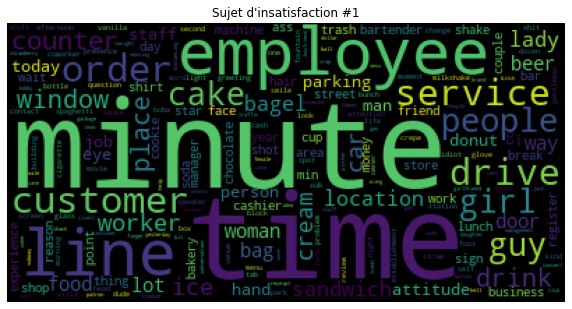

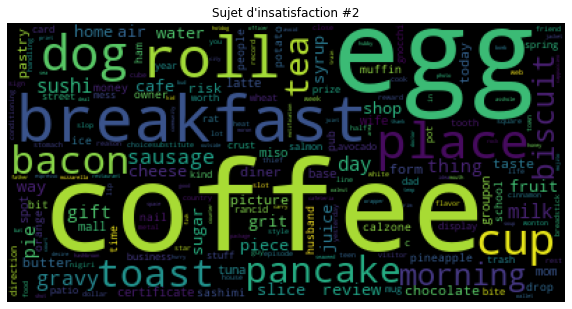

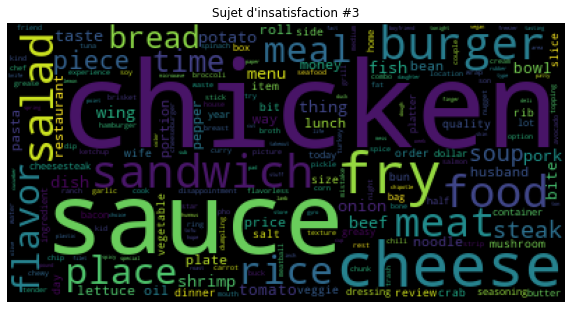

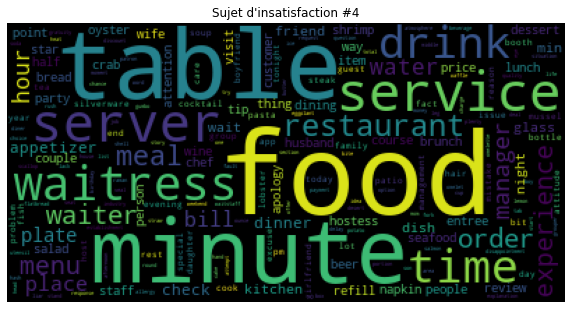

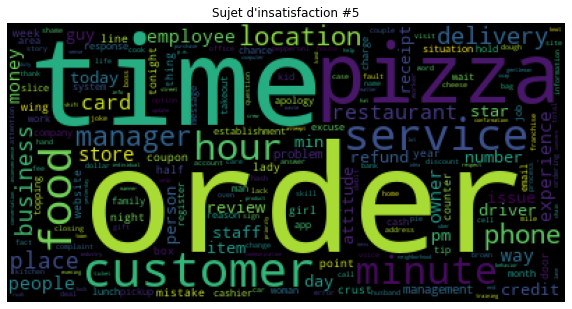

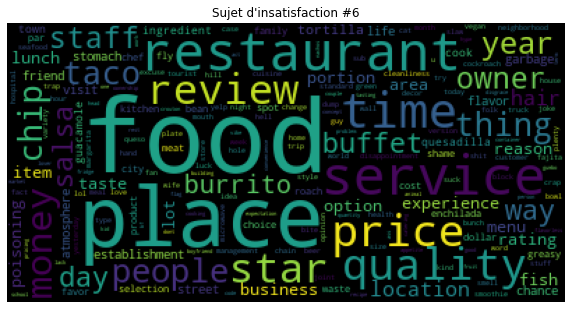

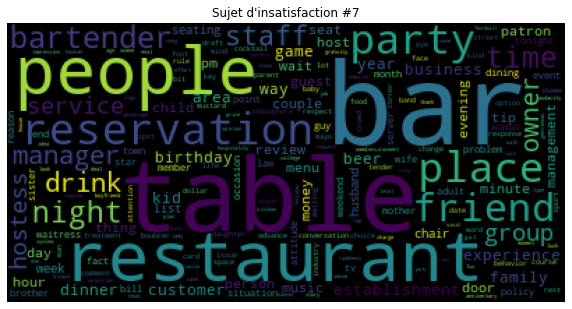

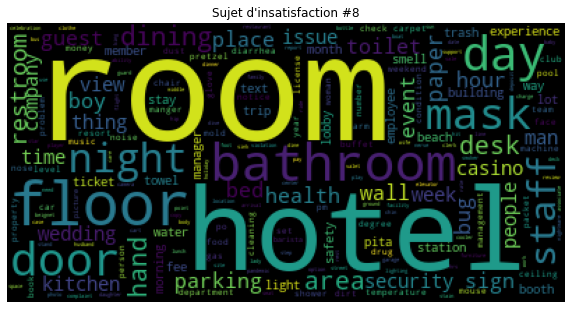

<IPython.core.display.Javascript object>

In [117]:
visualization_wordcloud(model_lda_bow)

> ### <span style='color:#CB5000'>Utilisation de PyLDAvis pour la visualisation des sujets d'insatisfaction.</span>
- PyLDAvis est une bibliothèque spécialisée pour la visualisation interactive des résultats d'un modèle LDA
- Elle permet :
    - Une meilleure compréhension et interprétation des topics de façon individuelle.
    - Une meilleure compréhension des relations entre les topics.

In [118]:
# visualisation avec pyLDAvis.gensim_models
def visualization_pyldavis(model, corpus, dictionary):
    print("Visualisation des sujets d'insatisfaction avec pyLDAvis :")
    pyldavis = pyLDAvis.gensim_models.prepare(model, corpus, dictionary)

    return pyldavis

<IPython.core.display.Javascript object>

In [164]:
warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")

<IPython.core.display.Javascript object>

In [166]:
visualization_pyldavis(model_lda_bow, bow_corpus, dictionary)

Visualisation des sujets d'insatisfaction avec pyLDAvis :


/home/kader/miniconda3/envs/tensorflow/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/kader/miniconda3/envs/tensorflow/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/home/kader/miniconda3/envs/tensorflow/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/kader/miniconda3/envs/tensorflow/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/kader/miniconda3/envs/tensorflow/lib/python3.9/site-packages/setuptools/_distutils

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.075721 -0.147895       1        1  21.540803
2      0.230305 -0.150230       2        1  18.007692
4     -0.141201 -0.047076       3        1  15.842986
5      0.043047 -0.109686       4        1  12.230893
6     -0.147679 -0.007926       5        1  12.144517
0     -0.125337  0.037335       6        1   8.840127
7     -0.070439  0.271747       7        1   6.228837
1      0.287025  0.153732       8        1   5.164145, topic_info=        Term          Freq         Total Category  logprob  loglift
23      food  69044.000000  69044.000000  Default  30.0000  30.0000
40     order  30738.000000  30738.000000  Default  29.0000  29.0000
31     table  23531.000000  23531.000000  Default  28.0000  28.0000
349    pizza  12210.000000  12210.000000  Default  27.0000  27.0000
67   chicken  12767.000000  12767.000000  Default  26.0000  26.0000
..       ...           ...           ...      ...      ...      ...
132    thing    594.887115   9527.189256   Topic8  -4.9680   0.1899
234    water    503.675210   6000.257635   Topic8  -5.1344   0.4858
59    review    442.236171   9213.479698   Topic8  -5.2645  -0.0731
46       way    424.133700   9892.373413   Topic8  -5.3063  -0.1860
277    piece    406.873801   4040.180593   Topic8  -5.3478   0.6679

[569 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
1634      6  0.995050  FINALLY
1022      1  0.002181  account
1022      3  0.844182  account
1022      4  0.089435  account
1022      5  0.026176  account
...     ...       ...      ...
179       6  0.055599     year
179       7  0.033389     year
179       8  0.023387     year
2130      1  0.996323     yike
1587      4  0.996695     yuck

[1324 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 3, 5, 6, 7, 1, 8, 2])

<IPython.core.display.Javascript object>

#### Modèle LDA avec Bag-Of-Words - 8 topics
#### Interprétation des résultats - Sujets d'insatisfaction :
- Sujet d'insatisfaction 1 : **restaurant : service / emplacement**
- Sujet d'insatisfaction 2 : **petit-déjeuner / brunch**
- Sujet d'insatisfaction 3 : **restaurant : nourriture / service / menu déjeuner**
- Sujet d'insatisfaction 4 : **service de livraison / commandes / temps**
- Sujet d'insatisfaction 5 : **hotel**
- Sujet d'insatisfaction 6 : **sandwicherie / fast-food**
- Sujet d'insatisfaction 7 : **bar / restauration / sortie nocturne**
- Sujet d'insatisfaction 8 : **hotel**

> ###  <font color=#0088B4>Synthèse</font>
- Le score de cohérence est bon.
- Les sujets d'insatisfaction des clients sont clairement identifiables et interprétables d'un point de vue métier.
- Certains topics se chevauchent, notamment 5-6 et 5-3.

> ### <span style='color:#8D6301'>Modélisation avec 5 sujets d'insatisfaction clients : `num_topics=5`</span>

Modélisation LDA : OK

Affichage des Topics : 
Topic: 0 
Words: 0.035*"bar" + 0.027*"place" + 0.022*"people" + 0.018*"table" + 0.017*"time" + 0.017*"drink" + 0.015*"staff" + 0.015*"restaurant"
Topic: 1 
Words: 0.034*"place" + 0.024*"coffee" + 0.020*"room" + 0.016*"food" + 0.014*"day" + 0.013*"hotel" + 0.012*"breakfast" + 0.011*"ice"
Topic: 2 
Words: 0.042*"food" + 0.032*"chicken" + 0.027*"place" + 0.021*"sauce" + 0.021*"cheese" + 0.016*"fry" + 0.015*"burger" + 0.015*"sandwich"
Topic: 3 
Words: 0.071*"food" + 0.041*"table" + 0.035*"service" + 0.031*"minute" + 0.028*"restaurant" + 0.027*"server" + 0.027*"time" + 0.025*"waitress"
Topic: 4 
Words: 0.065*"order" + 0.047*"time" + 0.046*"food" + 0.034*"customer" + 0.034*"pizza" + 0.033*"service" + 0.026*"minute" + 0.020*"location"

Evaluation du modèle :
Score de Perplexité = -6.574
Score de Cohérence = 0.591

Visualisation :
Visualisation des sujets d'insatisfaction sous forme de nuages de mots :


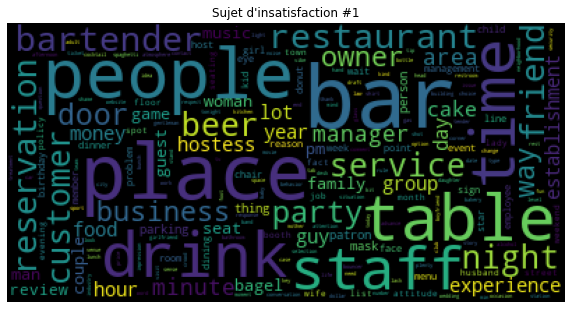

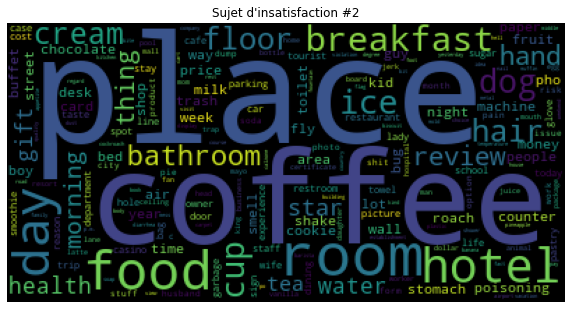

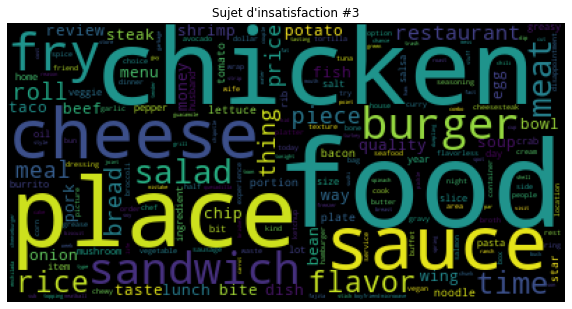

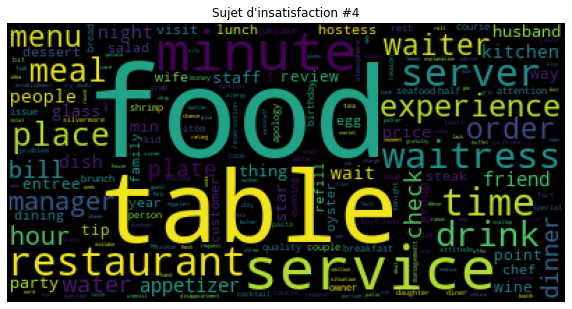

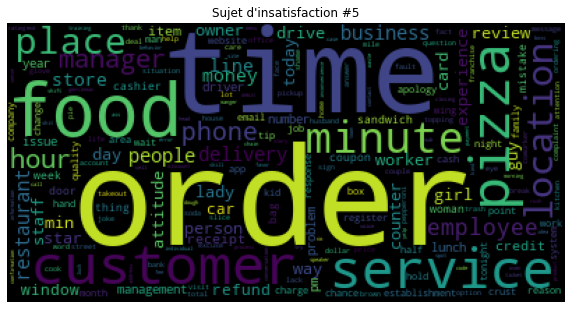

Visualisation des sujets d'insatisfaction avec pyLDAvis :


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.069562  0.123560       1        1  26.606785
2      0.223973  0.164819       2        1  23.879995
4     -0.141114  0.020948       3        1  21.788181
0     -0.160318 -0.065445       4        1  17.256286
1      0.147021 -0.243882       5        1  10.468754, topic_info=        Term          Freq         Total Category  logprob  loglift
40     order  30637.000000  30637.000000  Default  30.0000  30.0000
31     table  23269.000000  23269.000000  Default  29.0000  29.0000
349    pizza  12202.000000  12202.000000  Default  28.0000  28.0000
67   chicken  12719.000000  12719.000000  Default  27.0000  27.0000
108      bar   9915.000000   9915.000000  Default  26.0000  26.0000
..       ...           ...           ...      ...      ...      ...
132    thing   1187.481201   9472.478062   Topic5  -4.9834   0.1802
234    water    970.990304   5978.990723   Topic5  -5.1847   0.4391
258     star   1042.700708   8202.753527   Topic5  -5.1134   0.1941
75     night    736.149977   8644.249852   Topic5  -5.4616  -0.2064
46       way    736.548640   9817.988668   Topic5  -5.4610  -0.3332

[399 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
1163      3  0.987675    10min
3072      3  0.988854    20min
1712      3  0.998648  address
1484      1  0.016238      air
1484      5  0.982402      air
...     ...       ...      ...
179       2  0.192384     year
179       3  0.216988     year
179       4  0.280128     year
179       5  0.101528     year
2130      1  0.994659     yike

[830 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 3, 5, 1, 2])

<IPython.core.display.Javascript object>

In [120]:
# Modélisation
model_lda_bow_5topics = model_lda(5, bow_corpus, dictionary)

# Evaluation du modèle
print("\nEvaluation du modèle :")
perplexity_score = compute_perplexity_score(model_lda_bow_5topics, bow_corpus)
print("Score de Perplexité = %.3f" % (perplexity_score))
coherence_score = compute_coherence_score(
    model_lda_bow_5topics, list_neg_reviews, dictionary
)
print("Score de Cohérence = %.3f" % (coherence_score))

# Visualisation du modèle
print("\nVisualisation :")
visualization_wordcloud(model_lda_bow_5topics)
visualization_pyldavis(model_lda_bow_5topics, bow_corpus, dictionary)


#### Modèle LDA avec Bag-Of-Words - 5 topics
#### Interprétation des résultats - Sujets d'insatisfaction :
- Sujet d'insatisfaction 1 : **restaurant : service du bar**
- Sujet d'insatisfaction 2 : **hotel / petit déjeuner / emplacement**
- Sujet d'insatisfaction 3 : **restaurant : nourriture**
- Sujet d'insatisfaction 4 : **hotel**
- Sujet d'insatisfaction 5 : **restaurant : temps d'attente après commande**

> ###  <font color=#0088B4>Synthèse</font>
- Le score de cohérence est bon.
- Les sujets d'insatisfaction sont clairement identifiables et interprétables d'un point de vue métier.
- Il n'y a pas d'overlap entre les sujets d'insatisfaction.

> ### <span style='color:#CB5000'>Sélection du nombre optimal de sujets d'insatisfaction</span>

#### Calcul des Scores de Perplexité et de Cohérence pour différents nombres de sujets d'insatisfaction

In [121]:
def compute_coherence_perplexity_scores_ldamodel(
    start, stop, step, corpus, dictionary, documents
):
    coherence_scores = []
    perplexity_scores = []
    for num_topics in range(start, stop + 1, step):

        print(f"\nCalcul pour {num_topics} topics :")
        model_lda = LdaModel(
            corpus=corpus,
            num_topics=num_topics,
            id2word=dictionary,
            passes=2,
            random_state=SEED,
        )

        perplexity_score = model_lda.log_perplexity(corpus)
        perplexity_scores.append(perplexity_score)
        print("Score de Perplexité = %.3f" % (perplexity_score))

        coherence_model = CoherenceModel(
            model=model_lda, texts=documents, dictionary=dictionary, coherence="c_v"
        )
        coherence_score = coherence_model.get_coherence()
        coherence_scores.append(coherence_score)
        print("Score de Cohérence = %.3f" % (coherence_score))

    return coherence_scores, perplexity_scores

<IPython.core.display.Javascript object>

#### Nous calculons les scores pour des nombres de sujets d'insatisfaction compris entre 3 et 12 :
- 3 nous semble être le nombe de sujets minimal d'un point de vue métier : en dessous ce n'est pas assez précis pour être utilisé d'un point de vue métier
- 12 nous semble être le nomtre de sujets maximal d'un point de vue métier : au dessus il y aurait trop de sujets pour être exploité d'un point de vue métier

In [122]:
min_topics = 3
max_topics = 12

<IPython.core.display.Javascript object>

In [123]:
# warnings.filterwarnings("ignore", category=ResourceWarning)

<IPython.core.display.Javascript object>

In [124]:
coherence_scores, perplexity_scores = compute_coherence_perplexity_scores_ldamodel(
    min_topics, max_topics, 1, bow_corpus, dictionary, list_neg_reviews
)


Calcul pour 3 topics :
Score de Perplexité = -6.558
Score de Cohérence = 0.552

Calcul pour 4 topics :
Score de Perplexité = -6.560
Score de Cohérence = 0.579

Calcul pour 5 topics :
Score de Perplexité = -6.574
Score de Cohérence = 0.591

Calcul pour 6 topics :
Score de Perplexité = -6.606
Score de Cohérence = 0.574

Calcul pour 7 topics :
Score de Perplexité = -6.644
Score de Cohérence = 0.596

Calcul pour 8 topics :
Score de Perplexité = -6.690
Score de Cohérence = 0.594

Calcul pour 9 topics :
Score de Perplexité = -6.744
Score de Cohérence = 0.586

Calcul pour 10 topics :
Score de Perplexité = -6.845
Score de Cohérence = 0.597

Calcul pour 11 topics :
Score de Perplexité = -6.967
Score de Cohérence = 0.605

Calcul pour 12 topics :
Score de Perplexité = -7.105
Score de Cohérence = 0.608


<IPython.core.display.Javascript object>

In [125]:
x = [int(i) for i in range(min_topics, max_topics + 1)]

<IPython.core.display.Javascript object>

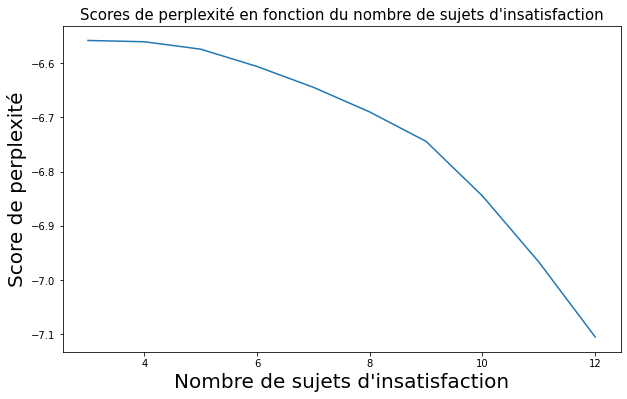

<IPython.core.display.Javascript object>

In [126]:
plt.figure(figsize=(10, 6))
plt.plot(x, perplexity_scores)
plt.title(
    "Scores de perplexité en fonction du nombre de sujets d'insatisfaction", fontsize=15
)
plt.xlabel("Nombre de sujets d'insatisfaction", fontsize=20)
plt.ylabel("Score de perplexité", fontsize=20)
plt.show()

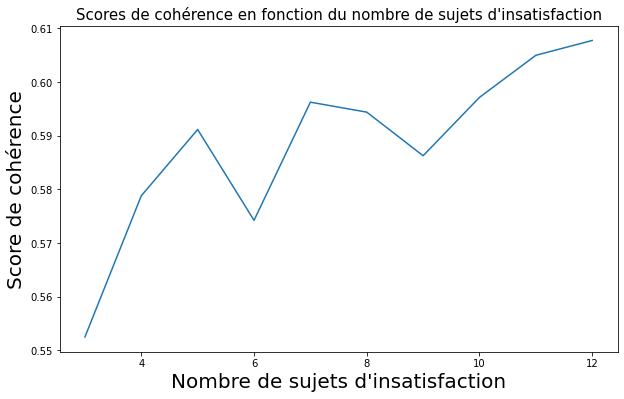

<IPython.core.display.Javascript object>

In [127]:
plt.figure(figsize=(10, 6))
plt.plot(x, coherence_scores)
plt.title(
    "Scores de cohérence en fonction du nombre de sujets d'insatisfaction", fontsize=15
)
plt.xlabel("Nombre de sujets d'insatisfaction", fontsize=20)
plt.ylabel("Score de cohérence", fontsize=20)
plt.show()

> ###  <font color=#0088B4>Synthèse</font>
- Le score de perplexité est continuement décroissant
- Le score de cohérence est maximal pour 5 et 7 sujets d'instisfaction. Au delà les sujets deviendront difficilement interprétables.
- Le choix entre les deux doit se faire avec les personnes du métier :
    - 5 sujets d'insatisfaction : sujets bien scindés.
    - 7 sujets d'insatisfaction : sujets plus précis.

> ## <span style='color:#009694' id="section_3_3_3"> 3.3.3. Représentation TF-IDF</span>
    TF : Term Frequency || IDF : Inverse Document Frequency
- On compte le nombre d'apparitions du mot dans le document (TF).
- On pondére par l'inverse du nombre d'apparitions du mot dans l'ensemble des documents (IDF).
> Par rapport à une représentation Bag-Of-Words, cela permet de donner plus d'importance aux mots qui apparaissent fréquemment dans un document mais peu fréquemment dans les autres documents, ce qui signifie que le mot a de l'importance dans ce document en particulier. 

In [128]:
def create_tfidf_corpus(bow_corpus):
    # On crée le corpus TF-IDF
    tfidf = TfidfModel(bow_corpus, smartirs="ntc")
    tfidf_corpus = tfidf[bow_corpus]
    print("Création du Corpus TF-IDF : OK")
    return tfidf_corpus

<IPython.core.display.Javascript object>

In [129]:
tfidf_corpus = create_tfidf_corpus(bow_corpus)

Création du Corpus TF-IDF : OK


<IPython.core.display.Javascript object>

> ### <span style='color:#64017A'>Modèle LDA avec TF-IDF</span>

In [130]:
len(dictionary)

23799

<IPython.core.display.Javascript object>

#### Création d'une fonction 'pipeline' :
- Nous créons une fonction 'pipeline' regroupant les fonctions de nettoyage, preprocessing et modélisation
- Cela permet d'automatiser le processus

In [131]:
def pipeline_dict_tfidf_creator(df_neg_reviews):
    # Nettoyage des données
    df_neg_reviews_clean = clean_data(df_neg_reviews)

    # PreProcessing des données
    df_neg_reviews_preprocessed = preprocess_data(df_neg_reviews_clean, preprocessing)

    # Création du dictionnaire et de la liste des critiques
    dictionary, list_neg_reviews = create_dictionary(df_neg_reviews_preprocessed)
    # Création du corpus
    bow_corpus = create_bow_corpus(dictionary, list_neg_reviews)
    tfidf_corpus = create_tfidf_corpus(bow_corpus)

    return list_neg_reviews, dictionary, tfidf_corpus

<IPython.core.display.Javascript object>

> ### <span style='color:#CB5000'>Sélection du nombre optimal de sujets d'insatisfaction</span>

#### Calcul des Scores de Perplexité et de Cohérence pour différents nombres de sujets d'insatisfaction

In [133]:
min_topics = 3
max_topics = 12

<IPython.core.display.Javascript object>

In [134]:
coherence_scores, perplexity_scores = compute_coherence_perplexity_scores_ldamodel(
    min_topics, max_topics, 1, tfidf_corpus, dictionary, list_neg_reviews
)


Calcul pour 3 topics :
Score de Perplexité = -8.010
Score de Cohérence = 0.530

Calcul pour 4 topics :
Score de Perplexité = -8.191
Score de Cohérence = 0.467

Calcul pour 5 topics :
Score de Perplexité = -8.358
Score de Cohérence = 0.541

Calcul pour 6 topics :
Score de Perplexité = -8.503
Score de Cohérence = 0.502

Calcul pour 7 topics :
Score de Perplexité = -8.637
Score de Cohérence = 0.451

Calcul pour 8 topics :
Score de Perplexité = -8.795
Score de Cohérence = 0.480

Calcul pour 9 topics :
Score de Perplexité = -8.999
Score de Cohérence = 0.511

Calcul pour 10 topics :
Score de Perplexité = -9.274
Score de Cohérence = 0.521

Calcul pour 11 topics :
Score de Perplexité = -9.529
Score de Cohérence = 0.480

Calcul pour 12 topics :
Score de Perplexité = -9.861
Score de Cohérence = 0.490


<IPython.core.display.Javascript object>

In [135]:
x = [int(i) for i in range(min_topics, max_topics + 1)]

<IPython.core.display.Javascript object>

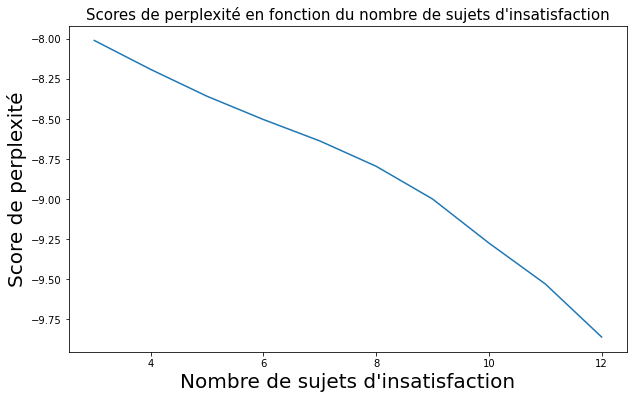

<IPython.core.display.Javascript object>

In [136]:
plt.figure(figsize=(10, 6))
plt.plot(x, perplexity_scores)
plt.title(
    "Scores de perplexité en fonction du nombre de sujets d'insatisfaction", fontsize=15
)
plt.xlabel("Nombre de sujets d'insatisfaction", fontsize=20)
plt.ylabel("Score de perplexité", fontsize=20)
plt.show()

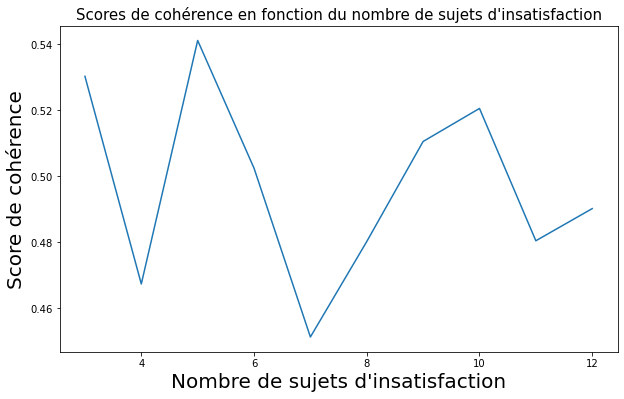

<IPython.core.display.Javascript object>

In [137]:
plt.figure(figsize=(10, 6))
plt.plot(x, coherence_scores)
plt.title(
    "Scores de cohérence en fonction du nombre de sujets d'insatisfaction", fontsize=15
)
plt.xlabel("Nombre de sujets d'insatisfaction", fontsize=20)
plt.ylabel("Score de cohérence", fontsize=20)
plt.show()

#### Conclusion :
- Le score de cohérence est maximal pour 5 et 10 sujets d'insatisafaction ensuite il décroit
- Le score de perplexité est nettement meilleur pour 5 sujets d'insatisfaction que pour 10
> **Nous allons faire la modélisation avec 5 sujets d'insatisfaction**

> ### <span style='color:#8D6301 '>Modélisation avec 5 sujets d'insatisfaction clients : `num_topics=5`</span>

In [138]:
model_lda_tfidf_5topics = model_lda(5, tfidf_corpus, dictionary)

Modélisation LDA : OK

Affichage des Topics : 
Topic: 0 
Words: 0.061*"pizza" + 0.013*"bagel" + 0.011*"cream" + 0.010*"coffee" + 0.010*"cheese" + 0.010*"crust" + 0.010*"ice" + 0.008*"slice"
Topic: 1 
Words: 0.018*"order" + 0.018*"delivery" + 0.014*"drive" + 0.012*"phone" + 0.010*"card" + 0.009*"minute" + 0.009*"driver" + 0.009*"employee"
Topic: 2 
Words: 0.016*"burger" + 0.013*"fry" + 0.010*"wing" + 0.010*"sandwich" + 0.009*"egg" + 0.008*"food" + 0.007*"place" + 0.007*"chicken"
Topic: 3 
Words: 0.013*"chicken" + 0.010*"food" + 0.009*"sauce" + 0.008*"salad" + 0.008*"place" + 0.008*"rice" + 0.007*"shrimp" + 0.007*"meat"
Topic: 4 
Words: 0.017*"service" + 0.016*"table" + 0.016*"food" + 0.016*"minute" + 0.014*"order" + 0.013*"time" + 0.012*"drink" + 0.012*"place"


<IPython.core.display.Javascript object>

> ### <span style='color:#CB5000'>Visualisation des sujets d'insatisfaction client</span>

Visualisation des sujets d'insatisfaction sous forme de nuages de mots :


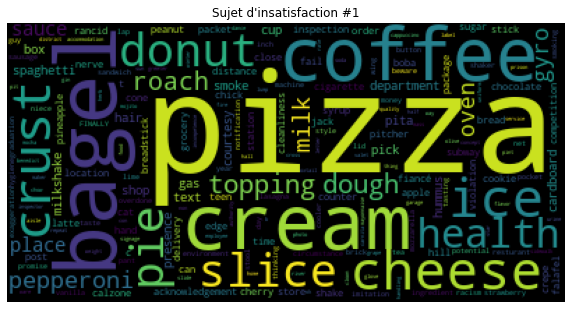

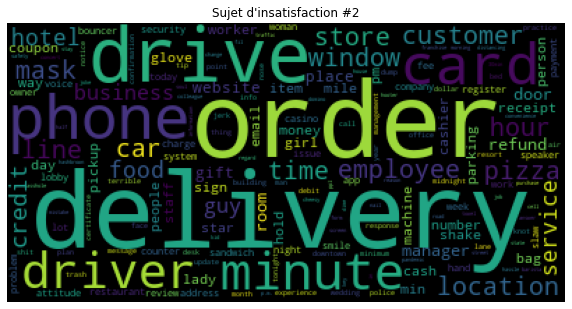

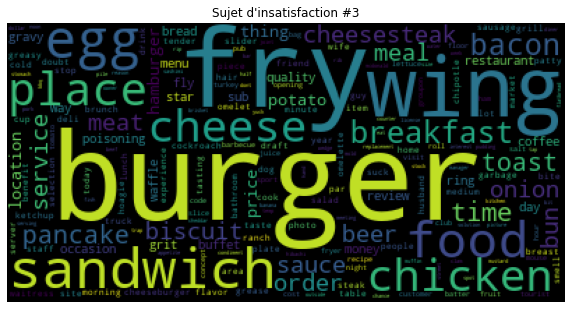

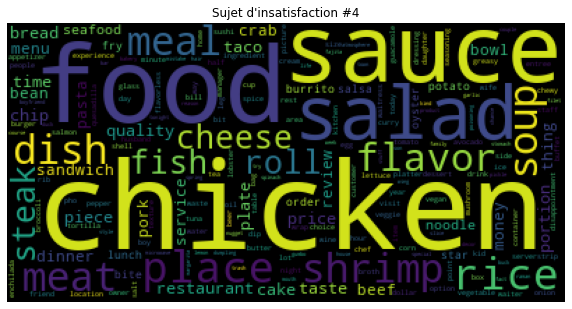

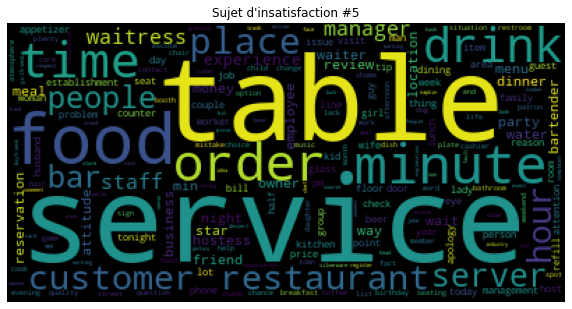

<IPython.core.display.Javascript object>

In [139]:
visualization_wordcloud(model_lda_tfidf_5topics)

In [140]:
warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")

<IPython.core.display.Javascript object>

In [141]:
# dict_tfidf = dictionary.filter_extremes(no_below=5, no_above=0.5)  # , keep_n=100000)
visualization_pyldavis(model_lda_tfidf_5topics, tfidf_corpus, dictionary)

Visualisation des sujets d'insatisfaction avec pyLDAvis :


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.170563  0.066768       1        1  33.236237
3      0.086481 -0.157077       2        1  27.011230
2      0.024052 -0.135593       3        1  16.094160
1      0.016381  0.231499       4        1  14.057897
0     -0.297478 -0.005597       5        1   9.600476, topic_info=         Term         Freq        Total Category  logprob  loglift
349     pizza  1920.000000  1920.000000  Default  30.0000  30.0000
150    burger   858.000000   858.000000  Default  29.0000  29.0000
347  delivery   773.000000   773.000000  Default  28.0000  28.0000
249     drive   596.000000   596.000000  Default  27.0000  27.0000
27      phone   766.000000   766.000000  Default  26.0000  26.0000
..        ...          ...          ...      ...      ...      ...
208      shop    88.331473   155.011538   Topic5  -5.6463   1.7810
65        box    92.393506   325.389975   Topic5  -5.6014   1.0844
102     sauce    94.630331   904.828316   Topic5  -5.5774   0.0856
28      place    95.630295  2147.461543   Topic5  -5.5669  -0.7682
436      hair    76.901989   397.949115   Topic5  -5.7849   0.6996

[359 rows x 6 columns], token_table=      Topic      Freq             Term
term                                  
1455      4  0.971769            30min
1645      5  0.993579  acknowledgement
1712      4  0.986589          address
437       4  0.989528          asshole
323       1  0.811728         attitude
...     ...       ...              ...
230       3  0.706426             wing
230       4  0.016240             wing
230       5  0.055215             wing
3717      1  0.989299            worth
1177      2  0.992730             wrap

[691 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 4, 3, 2, 1])

<IPython.core.display.Javascript object>

#### Modèle LDA avec TF-IDF - 5 topics
#### Interprétation des résultats - Sujets d'insatisfaction :
- Sujet d'insatisfaction 1 : **restaurant : nourriture**
- Sujet d'insatisfaction 2 : **restaurant : service de livraison / drive**
- Sujet d'insatisfaction 3 : **fast food**
- Sujet d'insatisfaction 4 : **restaurant : nourriture**
- Sujet d'insatisfaction 5 : **restaurant : service / emplacement**

> ###  <font color=#0088B4>Synthèse</font>
- Le score de cohérence est bon
- Les sujets d'insatisfaction sont globalement cohérents avec ceux du modèle précédent (LDA avec BagOfWords)
- Les sujets d'insatisfaction sont un peu moins clairement identifiables et interprétables, notamment le sujet 3 et 5.

#### Remarque :
- Nous avons étudié le modèle LDA avec une représentation Bag-Of-Words et une représentation TF-IDF
- Etant donné que le modèle LDA est un modèle probabiliste, la représentation Bag-Of-Words est plus adaptée que la représentation TF-IDF

## <span style='color:green' id="section_3_4">3.4. Modélisation NMF : Non-Negative Matrix Factorization</span>
- Le modèle NMF est une méthode d'algèbre linéaire basée sur la décomposition de matrices qui permet d'extraire des composantes latentes (cachées) d'un jeu de données (les topics)
- C'est un cas particulier de décomposition de matrice en valeurs singulières (SVD Single Value Decomposition) pour lequel les termes de la matrice sont non négatifs
- Cet algorithme est donc particulièrement adapté au problème de traitement du langage naturel puisque les occurrences de mots sont non négatives
- La non-négativité des termes entraîne des propriétés d'interprétabilité intéressantes
- L'algorithme permet d'extraire les composantes latentes du texte : pour cela la matrice 'document-term' est décomposée en une matrice 'document-topic' et une matrice 'topic-term', ce qui permet d'extraire les topics

> ## <span style='color:#009694' id="section_3_4_1">3.4.1. Modèle NMF avec Bag-Of-Words</span>

In [142]:
def model_nmf(num_topics, corpus, dictionary):
    # modélisation
    model_nmf = Nmf(
        corpus=corpus, num_topics=num_topics, id2word=dictionary, random_state=SEED
    )
    print("Modélisation NMF : OK")

    # affichage des topics
    print("\nAffichage des Topics : ")
    for idx, topic in model_nmf.print_topics(num_topics=-1, num_words=8):
        print("Topic: {} \nWords: {}".format(idx, topic))
        # print("\n")

    return model_nmf

<IPython.core.display.Javascript object>

> ### <span style='color:#8D6301 '>Modélisation avec 7 sujets d'insatisfaction clients : `num_topics=7`</span>

In [143]:
model_nmf_bow_7topics = model_nmf(7, bow_corpus, dictionary)

Modélisation NMF : OK

Affichage des Topics : 
Topic: 0 
Words: 0.109*"order" + 0.062*"minute" + 0.056*"food" + 0.049*"table" + 0.044*"drink" + 0.033*"waitress" + 0.030*"service" + 0.026*"server"
Topic: 1 
Words: 0.098*"food" + 0.076*"place" + 0.058*"restaurant" + 0.025*"service" + 0.015*"review" + 0.012*"owner" + 0.010*"dish" + 0.010*"customer"
Topic: 2 
Words: 0.144*"pizza" + 0.077*"order" + 0.024*"cheese" + 0.024*"place" + 0.024*"time" + 0.018*"delivery" + 0.017*"sauce" + 0.014*"customer"
Topic: 3 
Words: 0.056*"place" + 0.041*"room" + 0.020*"night" + 0.019*"people" + 0.018*"burger" + 0.015*"hotel" + 0.014*"bar" + 0.013*"day"
Topic: 4 
Words: 0.060*"time" + 0.045*"table" + 0.038*"service" + 0.035*"restaurant" + 0.034*"minute" + 0.027*"customer" + 0.020*"manager" + 0.014*"server"
Topic: 5 
Words: 0.064*"chicken" + 0.023*"drink" + 0.020*"meal" + 0.019*"salad" + 0.019*"sauce" + 0.014*"sandwich" + 0.012*"cheese" + 0.012*"server"
Topic: 6 
Words: 0.212*"food" + 0.116*"time" + 0.014*"hour

<IPython.core.display.Javascript object>

> ### <span style='color:#64017A'>Evaluation du modèle</span>

#### Score de cohérence

In [144]:
coherence_score = compute_coherence_score(
    model_nmf_bow_7topics, list_neg_reviews, dictionary
)
print("Score de Cohérence = %.3f" % (coherence_score))

Score de Cohérence = 0.591


<IPython.core.display.Javascript object>

> ### <span style='color:#CB5000'>Visualisation des sujets d'insatisfaction sous forme de WordCloud</span>

Visualisation des sujets d'insatisfaction sous forme de nuages de mots :


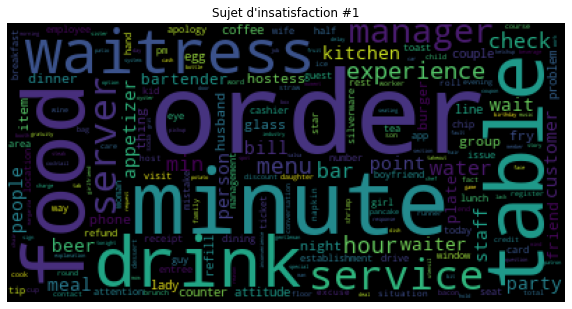

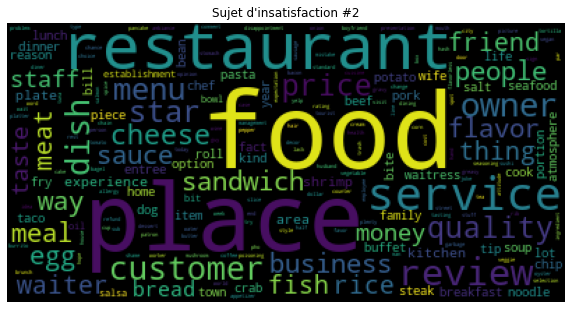

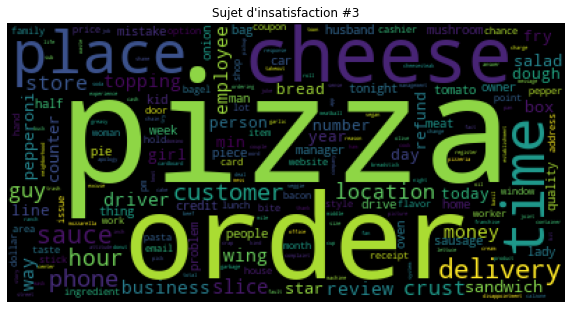

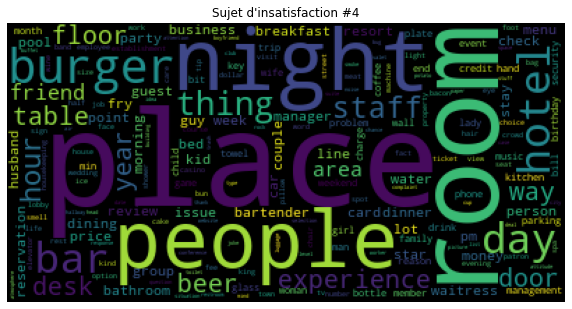

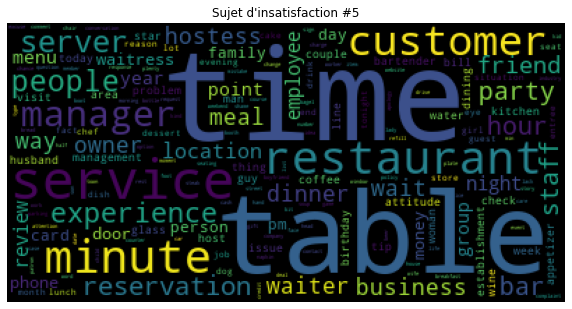

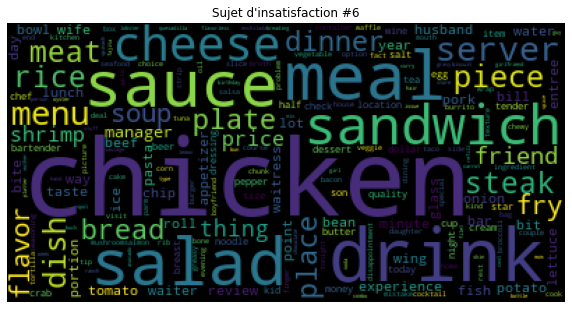

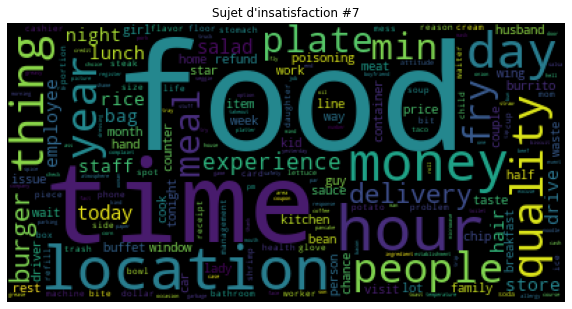

<IPython.core.display.Javascript object>

In [145]:
visualization_wordcloud(model_nmf_bow_7topics)

#### Modèle NMF avec Bag-Of-Words - 7 topics
#### Interprétation des résultats - Sujets d'insatisfaction :
- Sujet d'insatisfaction 1 : **restaurant : commande / appéritif**
- Sujet d'insatisfaction 2 : **restaurant : nourriture / déjeuner**
- Sujet d'insatisfaction 3 : **restaurant : commande / plat**
- Sujet d'insatisfaction 4 : **hotel / chambres/ emplacement / bar / boisson**
- Sujet d'insatisfaction 5 : **restaurant : service**
- Sujet d'insatisfaction 6 : **restaurant : menu / nourriture**
- Sujet d'insatisfaction 7 : **qualité des plats**

> ###  <font color=#0088B4>Synthèse</font>
- Le score de cohérence est bon.
- Les sujets d'insatisfaction sont identifiables et interprétables d'un point de vue métier.
- Ils semblent cependant l'être un peu moins que pour le modèle LDA :
    - certains sujets d'insatisfaction ne sont pas très clairs.
    - certains sujets d'insatisfaction sont similaires.
- On retrouve les sujets d'insatisfaction globalement similaires à ceux du modèle LDA
    - On peut noter le sujet d'insatisfaction bar / boisson qui ressort plus que pour le modèle LDA
    
> Ce modèle semble moins bon que les précédents basés sur une analyse LDA

> ### <span style='color:#8D6301 '>Modélisation avec 5 sujets d'insatisfaction clients : `num_topics=5`</span>

In [146]:
model_nmf_bow_5topics = model_nmf(5, bow_corpus, dictionary)

Modélisation NMF : OK

Affichage des Topics : 
Topic: 0 
Words: 0.165*"food" + 0.034*"table" + 0.031*"service" + 0.023*"restaurant" + 0.017*"server" + 0.017*"minute" + 0.013*"manager" + 0.012*"waitress"
Topic: 1 
Words: 0.126*"place" + 0.025*"food" + 0.013*"people" + 0.012*"review" + 0.010*"chicken" + 0.010*"star" + 0.010*"thing" + 0.008*"pizza"
Topic: 2 
Words: 0.121*"time" + 0.033*"service" + 0.024*"customer" + 0.018*"pizza" + 0.014*"manager" + 0.014*"restaurant" + 0.012*"location" + 0.010*"experience"
Topic: 3 
Words: 0.213*"order" + 0.037*"minute" + 0.025*"customer" + 0.018*"food" + 0.017*"pizza" + 0.017*"phone" + 0.014*"manager" + 0.014*"delivery"
Topic: 4 
Words: 0.040*"table" + 0.034*"minute" + 0.034*"drink" + 0.022*"restaurant" + 0.019*"bar" + 0.016*"server" + 0.015*"menu" + 0.015*"waitress"


<IPython.core.display.Javascript object>

> ### <span style='color:#64017A'>Evaluation du modèle</span>

#### Score de cohérence

In [147]:
coherence_score = compute_coherence_score(
    model_nmf_bow_5topics, list_neg_reviews, dictionary
)
print("Score de Cohérence = %.3f" % (coherence_score))

Score de Cohérence = 0.565


<IPython.core.display.Javascript object>

> ### <span style='color:#CB5000'>Visualisation des sujets d'insatisfaction sous forme de WordCloud</span>

Visualisation des sujets d'insatisfaction sous forme de nuages de mots :


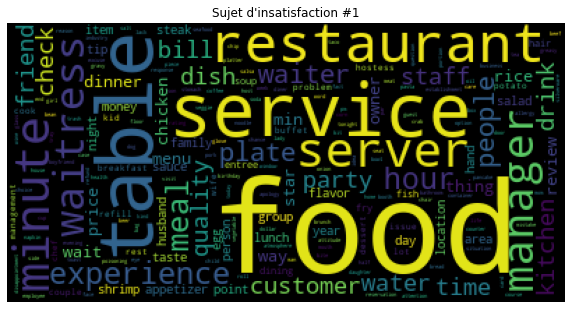

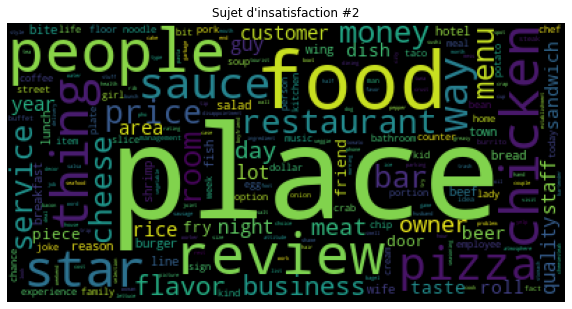

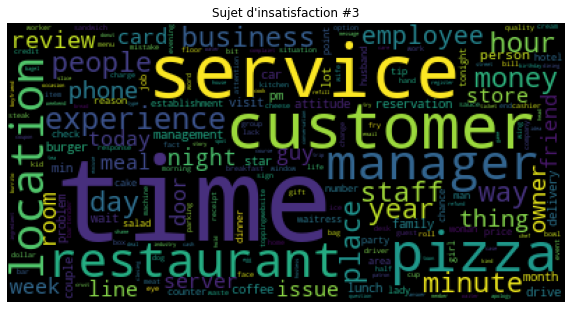

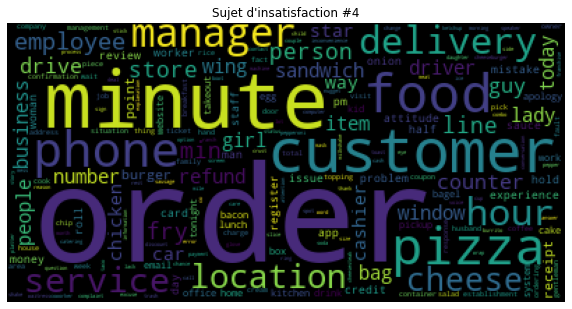

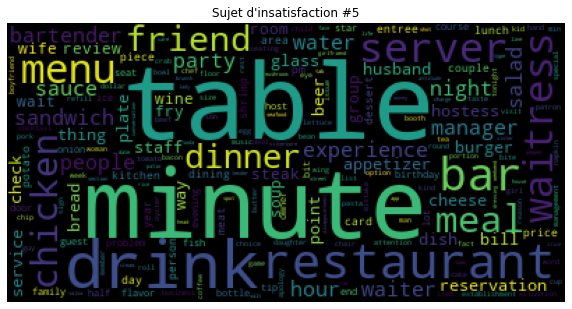

<IPython.core.display.Javascript object>

In [148]:
visualization_wordcloud(model_nmf_bow_5topics)

#### Modèle NMF avec Bag-Of-Words - 5 topics
#### Interprétation des résultats - Sujets d'insatisfaction :
- Sujet d'insatisfaction 1 : **restaurant : nourriture / service / emplacement**
- Sujet d'insatisfaction 2 : **hotel : chambres**
- Sujet d'insatisfaction 3 : **voiture : service de location voiture / voiturier**
- Sujet d'insatisfaction 4 : **réservation**
- Sujet d'insatisfaction 5 : **emplacement / bar / boisson**

> ###  <font color=#0088B4>Synthèse</font> 
- Le score de cohérence est bon mais légèrement inférieur au modèle LDA.
- Les sujets d'insatisfaction sont identifiables et interprétables d'un point de vue métier.
- Ils semblent cependant l'être un peu moins que pour le modèle LDA :
- On retrouve les sujets d'insatisfaction globalement similaires à ceux du modèle LDA.
    - On peut noter le sujet d'insatisfaction bar / boisson qui ressort plus que pour le modèle LDA.

> ### <span style='color:#CB5000'>Sélection du nombre optimal de sujets d'insatisfaction</span>

#### Calcul des Scores de Perplexité et de Cohérence pour différents nombres de sujets d'insatisfaction

In [149]:
def compute_coherence_scores_nmfmodel(start, stop, step, corpus, dictionary, documents):
    coherence_scores = []
    for num_topics in range(start, stop + 1, step):

        print(f"\nCalcul pour {num_topics} topics :")
        model_nmf = Nmf(
            corpus=corpus, num_topics=num_topics, id2word=dictionary, random_state=SEED
        )

        coherence_model = CoherenceModel(
            model=model_nmf, texts=documents, dictionary=dictionary, coherence="c_v"
        )
        coherence_score = coherence_model.get_coherence()
        coherence_scores.append(coherence_score)
        print("Score de Cohérence = %.3f" % (coherence_score))

    return coherence_scores

<IPython.core.display.Javascript object>

In [150]:
min_topics = 3
max_topics = 12

<IPython.core.display.Javascript object>

In [151]:
coherence_scores = compute_coherence_scores_nmfmodel(
    min_topics, max_topics, 1, bow_corpus, dictionary, list_neg_reviews
)


Calcul pour 3 topics :
Score de Cohérence = 0.574

Calcul pour 4 topics :
Score de Cohérence = 0.580

Calcul pour 5 topics :
Score de Cohérence = 0.565

Calcul pour 6 topics :
Score de Cohérence = 0.603

Calcul pour 7 topics :
Score de Cohérence = 0.591

Calcul pour 8 topics :
Score de Cohérence = 0.607

Calcul pour 9 topics :
Score de Cohérence = 0.602

Calcul pour 10 topics :
Score de Cohérence = 0.598

Calcul pour 11 topics :
Score de Cohérence = 0.597

Calcul pour 12 topics :
Score de Cohérence = 0.614


<IPython.core.display.Javascript object>

In [152]:
x = [int(i) for i in range(min_topics, max_topics + 1)]

<IPython.core.display.Javascript object>

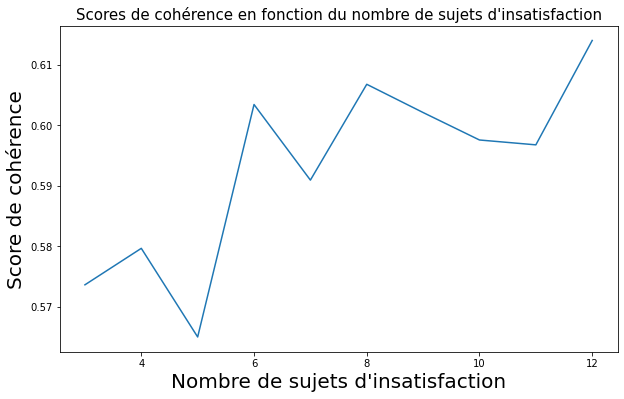

<IPython.core.display.Javascript object>

In [153]:
plt.figure(figsize=(10, 6))
plt.plot(x, coherence_scores)
plt.title(
    "Scores de cohérence en fonction du nombre de sujets d'insatisfaction", fontsize=15
)
plt.xlabel("Nombre de sujets d'insatisfaction", fontsize=20)
plt.ylabel("Score de cohérence", fontsize=20)
plt.show()

> ###  <font color=#0088B4>Synthèse</font>
- Le meilleur score de cohérence correspond à 8 sujets d'insatisfaction.

> ## <span style='color:#009694' id="section_3_4_2"> 3.4.2. Modèle NMF avec TF-IDF</span>

> ### <span style='color:#8D6301 '>Modélisation avec 8 sujets d'insatisfaction clients : `num_topics=8`</span>

In [154]:
model_nmf_tfidf_8topics = model_nmf(8, tfidf_corpus, dictionary)

Modélisation NMF : OK

Affichage des Topics : 
Topic: 0 
Words: 0.101*"minute" + 0.092*"table" + 0.033*"server" + 0.031*"wait" + 0.028*"service" + 0.021*"waitress" + 0.020*"hostess" + 0.017*"staff"
Topic: 1 
Words: 0.067*"customer" + 0.051*"service" + 0.027*"waiter" + 0.020*"sandwich" + 0.017*"manager" + 0.014*"door" + 0.014*"owner" + 0.013*"place"
Topic: 2 
Words: 0.175*"pizza" + 0.026*"cheese" + 0.019*"crust" + 0.015*"sauce" + 0.012*"place" + 0.012*"slice" + 0.011*"topping" + 0.009*"wing"
Topic: 3 
Words: 0.051*"food" + 0.026*"restaurant" + 0.020*"waitress" + 0.019*"place" + 0.018*"hour" + 0.016*"service" + 0.014*"meal" + 0.012*"quality"
Topic: 4 
Words: 0.099*"delivery" + 0.085*"order" + 0.069*"drink" + 0.067*"hour" + 0.037*"minute" + 0.035*"server" + 0.031*"burger" + 0.027*"driver"
Topic: 5 
Words: 0.068*"chicken" + 0.019*"fry" + 0.017*"sandwich" + 0.017*"burger" + 0.016*"rice" + 0.014*"sauce" + 0.012*"cheese" + 0.012*"salad"
Topic: 6 
Words: 0.023*"bar" + 0.021*"reservation" + 0.0

<IPython.core.display.Javascript object>

> ### <span style='color:#64017A'>Evaluation du modèle</span>

#### Score de cohérence

In [155]:
coherence_score = compute_coherence_score(
    model_nmf_tfidf_8topics, list_neg_reviews, dictionary
)
print("Score de Cohérence = %.3f" % (coherence_score))

Score de Cohérence = 0.581


<IPython.core.display.Javascript object>

> ### <span style='color:#CB5000'>Visualisation des sujets d'insatisfaction sous forme de WordCloud</span>

Visualisation des sujets d'insatisfaction sous forme de nuages de mots :


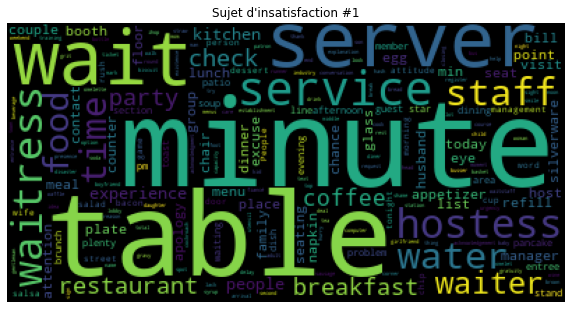

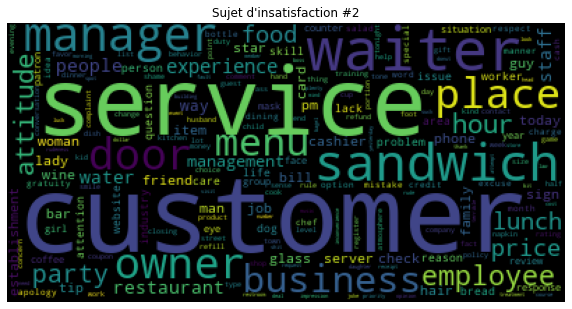

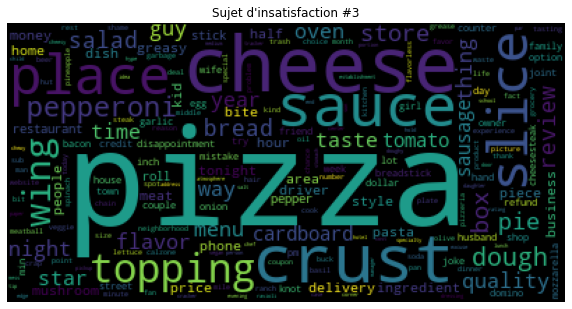

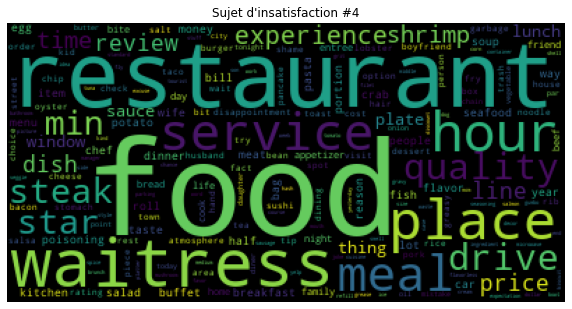

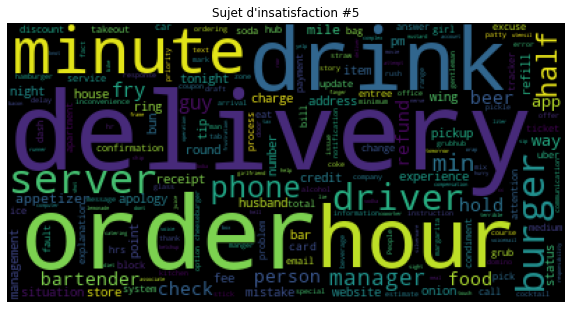

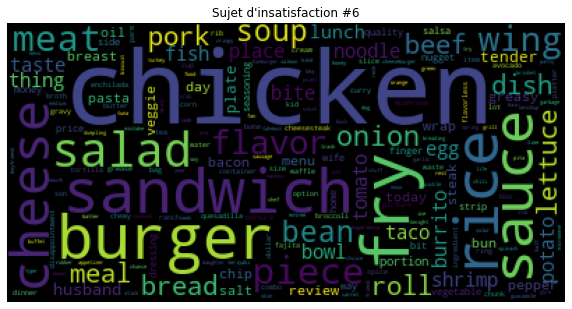

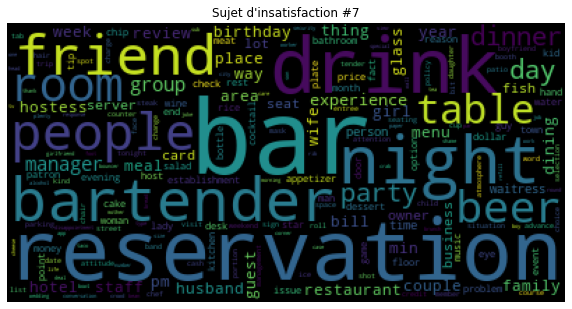

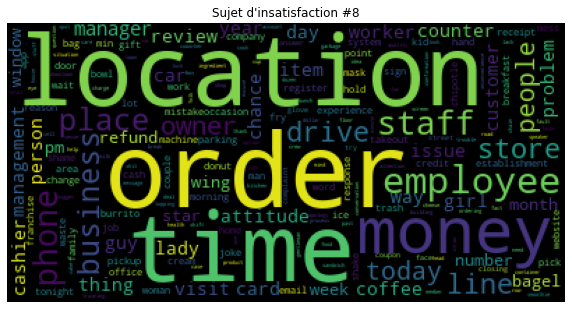

<IPython.core.display.Javascript object>

In [156]:
visualization_wordcloud(model_nmf_tfidf_8topics)

#### Modèle NMF avec TF-IDF - 8 topics
#### Interprétation des résultats - Sujets d'insatisfaction :
- Sujet d'insatisfaction 1 : **restaurant : service / personnel / temps d'attente**
- Sujet d'insatisfaction 2 : **restaurant : service / emplacement / menu**
- Sujet d'insatisfaction 3 : **pizzeria**
- Sujet d'insatisfaction 4 : **restaurant : nourriture / service**
- Sujet d'insatisfaction 5 : **fast-food / drive**
- Sujet d'insatisfaction 6 : **nourriture / fast-food**
- Sujet d'insatisfaction 7 : **bar / boisson / nuit**
- Sujet d'insatisfaction 8 : **pas clair**

> ###  <font color=#0088B4>Synthèse</font>
- Le score de cohérence est bon mais légèrement inférieur au modèle LDA
- Les sujets d'insatisfaction sont globalement identifiables et interprétables d'un point de vue métier
- Ils le sont cependant moins que pour le modèle LDA :
    - certains sujets d'insatisfaction ne sont pas très clairs (topics 3 et 8)
- On retrouve les sujets d'insatisfaction globalement similaires à ceux du modèle NMF avec Bag-Of-Words
    
> Ce modèle semble moins bon que les précédents basés sur une analyse LDA

> ### <span style='color:#8D6301 '>Modélisation avec 5 sujets d'insatisfaction clients : `num_topics=5`</span>

In [157]:
model_nmf_tfidf_5topics = model_nmf(5, tfidf_corpus, dictionary)

Modélisation NMF : OK

Affichage des Topics : 
Topic: 0 
Words: 0.043*"table" + 0.031*"minute" + 0.026*"server" + 0.022*"drink" + 0.018*"waitress" + 0.015*"hour" + 0.014*"manager" + 0.013*"restaurant"
Topic: 1 
Words: 0.056*"pizza" + 0.027*"bar" + 0.024*"place" + 0.013*"bartender" + 0.013*"beer" + 0.012*"people" + 0.012*"wing" + 0.011*"star"
Topic: 2 
Words: 0.040*"service" + 0.037*"food" + 0.030*"time" + 0.025*"place" + 0.024*"customer" + 0.023*"location" + 0.020*"money" + 0.018*"burger"
Topic: 3 
Words: 0.109*"order" + 0.030*"minute" + 0.025*"drive" + 0.024*"phone" + 0.022*"delivery" + 0.021*"hour" + 0.018*"customer" + 0.017*"min"
Topic: 4 
Words: 0.033*"chicken" + 0.025*"sandwich" + 0.014*"cheese" + 0.013*"sauce" + 0.011*"meat" + 0.011*"salad" + 0.010*"rice" + 0.010*"meal"


<IPython.core.display.Javascript object>

> ### <span style='color:#64017A'>Evaluation du modèle</span>

#### Score de cohérence

In [158]:
coherence_score = compute_coherence_score(
    model_nmf_tfidf_5topics, list_neg_reviews, dictionary
)
print("Score de Cohérence = %.3f" % (coherence_score))

Score de Cohérence = 0.609


<IPython.core.display.Javascript object>

> ### <span style='color:#CB5000'>Visualisation des sujets d'insatisfaction sous forme de WordCloud</span>

Visualisation des sujets d'insatisfaction sous forme de nuages de mots :


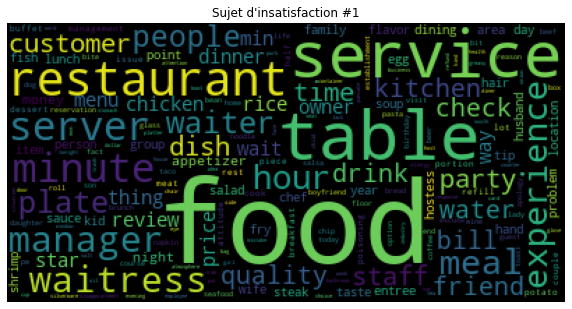

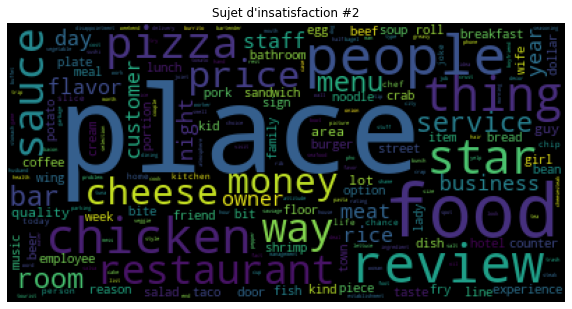

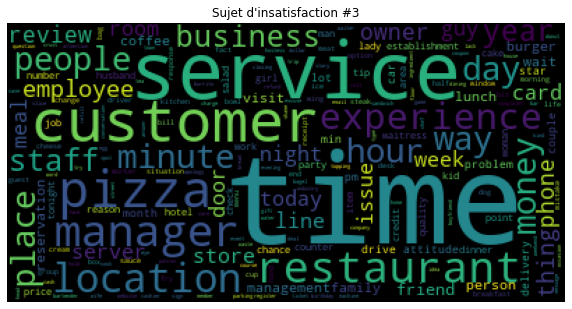

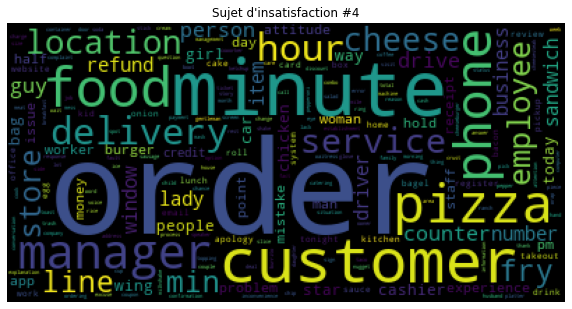

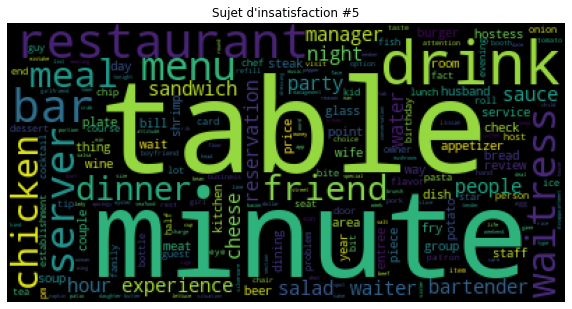

<IPython.core.display.Javascript object>

In [159]:
visualization_wordcloud(model_nmf_bow_5topics)

#### Modèle NMF avec TF-IDF - 5 topics
#### Interprétation des résultats - Sujets d'insatisfaction :
- Sujet d'insatisfaction 1 : **restaurant : nourriture / service / emplacement**
- Sujet d'insatisfaction 2 : **hotel : chambres**
- Sujet d'insatisfaction 3 : **voiture : service de location voiture / voiturier**
- Sujet d'insatisfaction 4 : **réservation**
- Sujet d'insatisfaction 5 : **emplacement / bar / boisson**

> ###  <font color=#0088B4>Synthèse</font> 
- Le score de cohérence est bon mais légèrement inférieur au modèle LDA
- Les sujets d'insatisfaction sont identifiables et interprétables d'un point de vue métier
- On retrouve les sujets d'insatisfaction globalement similaires à ceux du modèle NMF sur représentation Bag-Of-Words

### Sélection du nombre optimal de sujets d'insatisfaction

#### Calcul des Scores de Perplexité et de Cohérence pour différents nombres de sujets d'insatisfaction

In [160]:
min_topics = 3
max_topics = 12

<IPython.core.display.Javascript object>

In [161]:
coherence_scores = compute_coherence_scores_nmfmodel(
    min_topics, max_topics, 1, tfidf_corpus, dictionary, list_neg_reviews
)


Calcul pour 3 topics :
Score de Cohérence = 0.594

Calcul pour 4 topics :
Score de Cohérence = 0.586

Calcul pour 5 topics :
Score de Cohérence = 0.609

Calcul pour 6 topics :
Score de Cohérence = 0.582

Calcul pour 7 topics :
Score de Cohérence = 0.588

Calcul pour 8 topics :
Score de Cohérence = 0.581

Calcul pour 9 topics :
Score de Cohérence = 0.608

Calcul pour 10 topics :
Score de Cohérence = 0.583

Calcul pour 11 topics :
Score de Cohérence = 0.585

Calcul pour 12 topics :
Score de Cohérence = 0.611


<IPython.core.display.Javascript object>

In [162]:
x = [int(i) for i in range(min_topics, max_topics + 1)]

<IPython.core.display.Javascript object>

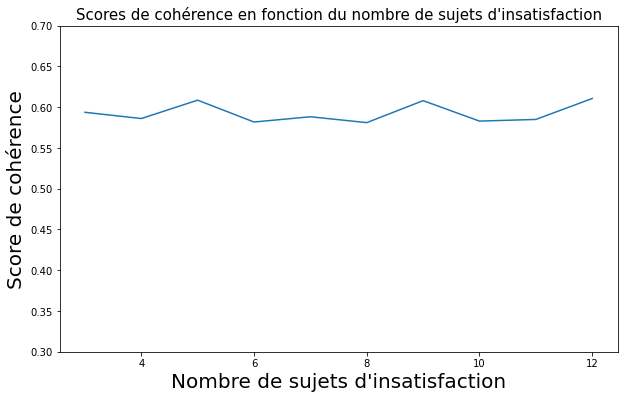

<IPython.core.display.Javascript object>

In [163]:
plt.figure(figsize=(10, 6))
plt.plot(x, coherence_scores)
plt.ylim(0.3, 0.7)
plt.title(
    "Scores de cohérence en fonction du nombre de sujets d'insatisfaction", fontsize=15
)
plt.xlabel("Nombre de sujets d'insatisfaction", fontsize=20)
plt.ylabel("Score de cohérence", fontsize=20)
plt.show()

> ###  <font color=#0088B4>Synthèse</font>
- Les valeurs optimales correspondent à 5 et 9 sujets. Cependant, l'écat avec les autres nombres ne sont pas énormes.
- On peut donc rester sur nos choix de paramètres 'métier' à 5 et 8 sujets d'insatisfaction

# <span style='color:blue' id="section_4" >4. Conclusion</span>

- Les résultats de la détection des sujets d'insatisfaction sont bons
- Les scores de cohérence sont globalement élevés (autour de 0.6), ils sont un peu meilleurs pour le modèle LDA
- Sur tous les modèles, les sujets d'insatisfaction sont globalement identifiables et interprétables d'un point de vue métier
- Le modèle LDA présente une meilleure interprétabilité d'un point de vue métier
- Le meilleur modèle est le LDA avec une représentation Bag-Of-Words et 5 ou 7 sujets d'insatisfaction
- Ce modèle donne de très bons résulats en terme d'identification et interprétabilité des sujets d'instisfaction
- On pourra montrer aux personnes du métier les résultats avec 5 et 7 topcis et ils pourront choisir ce qui leur convient le mieux
### <font style='color:#016C97'> Cette étude montre que l'objectif fixé : détecter les différents sujets d’insatisfaction à partir de l'analyse des commentaires, est atteignable</font>